#### Imports

In [143]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import numpy as np

#### Read In Data

In [103]:
data = pd.read_csv('./data/model_data_v2.csv')
single = pd.read_csv('./data/model_single_txns.csv')
lr = pd.read_csv('./data/lr_analysis.csv')
coefs = pd.read_csv('./data/lr_coefficients.csv', index_col=0)
svr = pd.read_csv('./data/svr_analysis.csv')
stats = pd.read_csv('./data/stats.csv', index_col=0).rename(columns={'0':'stats'}).T

In [91]:
score_cols = ["1of1_score","watch_score","background_score","beard_score","chain_score","eyes_score","hat_over_headphones_score","hat_under_headphones_score","headphones_score","long_hair_score","mouth_score","shirt_score","short_hair_score","smoke_score","type_score","rarity_score"]
rarity_cols = ["1of1_rarity","watch_rarity","background_rarity","beard_rarity","chain_rarity","eyes_rarity","hat_over_headphones_rarity","hat_under_headphones_rarity","headphones_rarity","long_hair_rarity","mouth_rarity","shirt_rarity","short_hair_rarity","smoke_rarity"]
feature_cols = ['1/1','4:20 watch','background','beard', 'chain', 'eyes','hat over headphones','hat under headphones','headphones','long hair','mouth','shirt','short hair','smoke','type']
non_cols = ['date', 'token_id', 'payment', 'buyer', 'seller', 'price', 'priceUsd']

#### Exploratory Data Analysis

In [26]:
data.head()

,date,token_id,payment,buyer,seller,price,priceUsd,1/1,4:20 watch,background,...,30d_avg_price,average_price,floor_price,last_10_avg,last_10_max,last_10_min,last_25_avg,last_25_max,last_25_min,last_sale_price
0,2021-11-30 21:35:15+00:00,1848,ETH,0xdd6d3324c75a5ae1480ef9f3394702dc28adb65e,0x97da20dc2bd46174da79d71a385b7248527fbee6,0.349,1623.037992,0,sub rose,blue,...,2.510842,1.147349,2.79,1833.707393,2325.269329,1581.183144,2232.053932,4650.538658,1581.183144,0.340
1,2021-11-30 21:35:15+00:00,6531,ETH,0xc2690edde996e5c56c9b7fafcdbdf257a780446b,0x7c121489e50e6672bbb59cc4c3fc86eaa8fb8364,0.350,1627.688530,0,sub black,blue,...,2.510842,1.147349,2.79,1819.755777,2325.269329,1581.183144,2111.139927,4418.011725,1581.183144,0.349
2,2021-11-30 21:35:15+00:00,4147,ETH,0xa7856843b4298a55a23a902ced79cc63c880d0d7,0x9e9b7dc5a0cfa97e3cc984d836d969ac13746951,0.385,1790.457383,0,sub red,red,...,2.510842,1.147349,2.79,1792.317599,2325.269329,1581.183144,2054.403355,4418.011725,1581.183144,0.350
3,2021-11-30 21:35:15+00:00,6176,ETH,0xd6a4eb571e6812d72f86076e9d2f902fef288278,0xf50131d7d2b5239fe1e934658fe3f6131532a437,0.450,2092.742396,0,0,blue,...,2.510842,1.147349,2.79,1769.064905,2325.269329,1581.183144,2052.543140,4418.011725,1581.183144,0.385
4,2021-11-30 21:35:15+00:00,7061,ETH,0x2ab5cf2e5b79a96bf70302de6f799c80e2a4b7cf,0xdf3fb2a51568f84c2fbafea5f8ad039b8d931b12,0.400,1860.215463,0,0,green,...,2.510842,1.147349,2.79,1785.341791,2325.269329,1581.183144,1998.596891,4418.011725,1581.183144,0.450


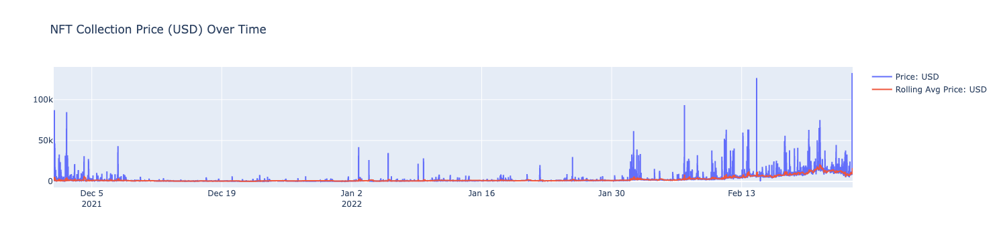

In [70]:
# How has price changed over time?

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.date, y=data.priceUsd, mode='lines', name='Price: USD'))
fig.add_trace(go.Scatter(x=data.date, y=data.priceUsd.rolling(25).mean(), mode='lines', name='Rolling Avg Price: USD'))
fig.update_layout(title="NFT Collection Price (USD) Over Time")
fig.show()

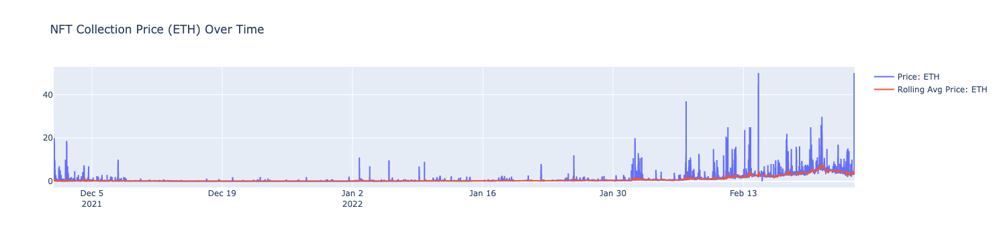

In [71]:
#same figure but price in ETH

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.date, y=data.price, mode='lines', name='Price: ETH'))
fig.add_trace(go.Scatter(x=data.date, y=data.price.rolling(25).mean(), mode='lines', name='Rolling Avg Price: ETH'))
fig.update_layout(title="NFT Collection Price (ETH) Over Time")
fig.show()

In [ ]:
['linear', 'hv', 'vh', 'hvh', 'vhv']

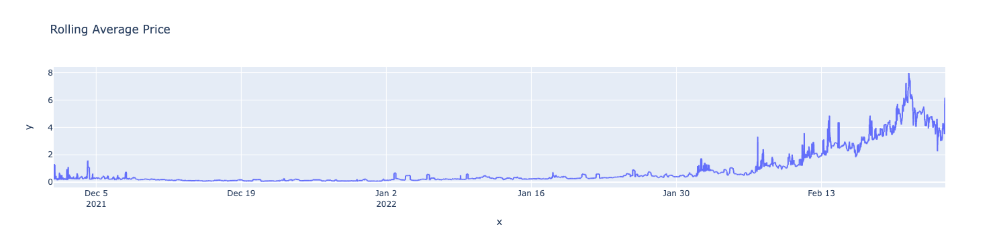

In [79]:
# What if we only look at the average?

fig = px.line(x=data.date, y=data.price.rolling(25).mean(), title='Rolling Average Price')
fig.show()

In [52]:
data.date = pd.to_datetime(data['date'])
recent = data.loc[data.date > '2022-2-1'].copy()

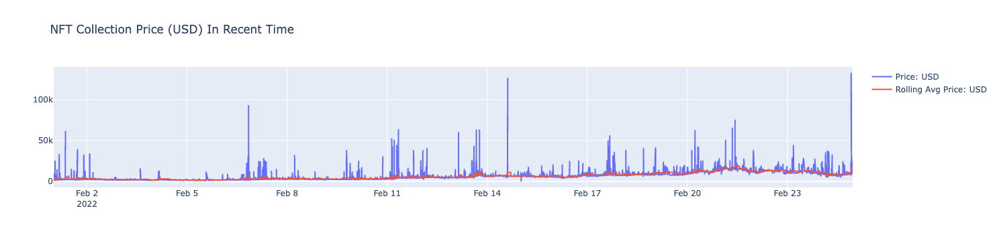

In [88]:
#What if we only look at the more recent transactions?

fig = go.Figure()
fig.add_trace(go.Scatter(x=recent.date, y=recent.priceUsd, mode='lines', name='Price: USD', line_shape='spline'))
fig.add_trace(go.Scatter(x=recent.date, y=recent.priceUsd.rolling(25).mean(), mode='lines', name='Rolling Avg Price: USD', line_shape='spline'))
fig.update_layout(title="NFT Collection Price (USD) In Recent Time")
fig.show()

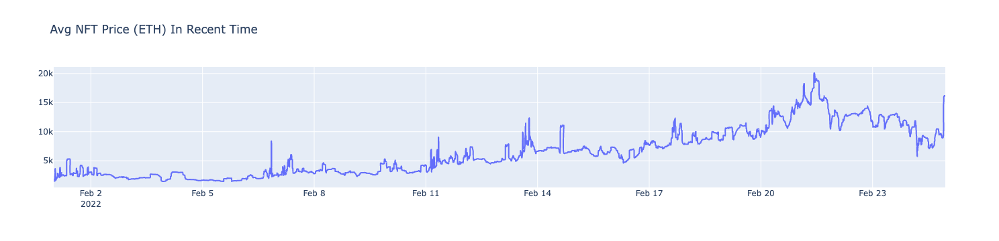

In [197]:
#only looking at recent average price?

fig = go.Figure()
fig.add_trace(go.Scatter(x=recent.date, y=recent.priceUsd.rolling(25).mean(), mode='lines', name='Recent Rolling Avg Price', line_shape='spline'))
fig.update_layout(title="Avg NFT Price (ETH) In Recent Time")
fig.show()

In [104]:
# How does the collection traded?
stats.T

,stats
one_day_volume,262.080800
one_day_change,-0.012042
one_day_sales,81.000000
one_day_average_price,3.235565
seven_day_volume,4460.061519
seven_day_change,-0.436667
seven_day_sales,1082.000000
seven_day_average_price,4.122053
thirty_day_volume,19705.088064
thirty_day_change,15.286376


In [116]:
stats[['average_price', 'seven_day_average_price', 'thirty_day_average_price']]

,average_price,seven_day_average_price,thirty_day_average_price
stats,1.147349,4.122053,2.510842


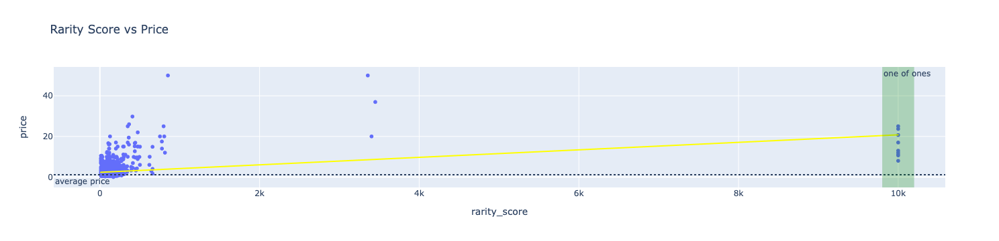

In [196]:
# How is feature rarity related to price?

fig = px.scatter(recent, x='rarity_score', y='price', hover_name='token_id', title='Rarity Score vs Price', trendline="ols", trendline_color_override="yellow")
fig.add_hline(y=1.147349, line_dash="dot", annotation_text="average price", annotation_position='bottom left')
fig.add_vrect(x0=9800, x1=10200, 
              annotation_text="one of ones", annotation_position="top left",
              fillcolor="green", opacity=0.25, line_width=0)
fig.show()

In [199]:
# identifying an outlier

In [132]:
data.loc[data.token_id == 905][score_cols]

,1of1_score,watch_score,background_score,beard_score,chain_score,eyes_score,hat_over_headphones_score,hat_under_headphones_score,headphones_score,long_hair_score,mouth_score,shirt_score,short_hair_score,smoke_score,type_score,rarity_score
3473,0.0,31.25,357.142857,0.0,0.0,29.239766,69.93007,0.0,2.532287,0.0,4.844961,0.0,0.0,0.0,357.142857,852.082798
11843,0.0,31.25,357.142857,0.0,0.0,29.239766,69.93007,0.0,2.532287,0.0,4.844961,0.0,0.0,0.0,357.142857,852.082798
19753,0.0,31.25,357.142857,0.0,0.0,29.239766,69.93007,0.0,2.532287,0.0,4.844961,0.0,0.0,0.0,357.142857,852.082798


In [133]:
#rarity_score is not a weighted metric, to improve rarity scores and address some of the outliers in the aobve scatter I would have to introduce weights to different features

In [140]:
# How are prices and rarity_scores distributed in the collection?

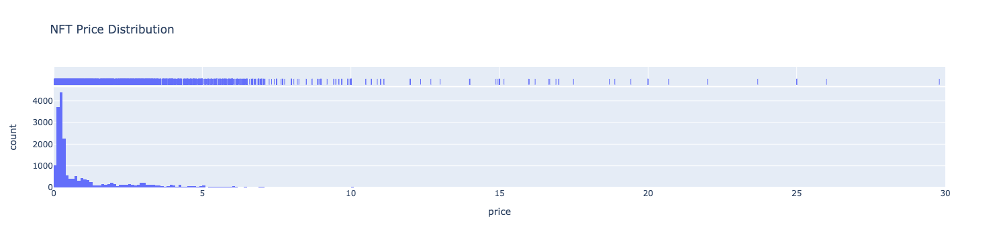

In [176]:
fig = px.histogram(data, x="price", range_x=(0,30), title='NFT Price Distribution', marginal='rug')
fig.show()

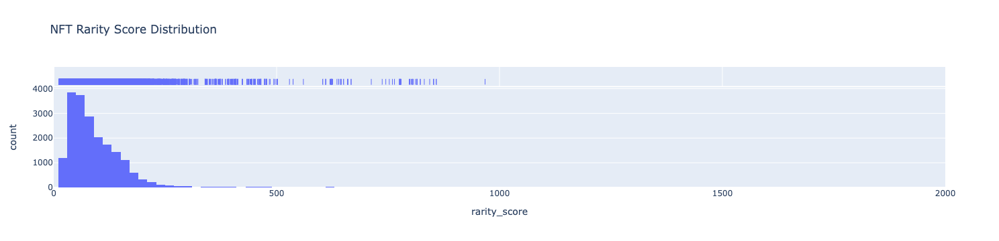

In [174]:
fig = px.histogram(data, x="rarity_score", range_x=(0,2_000), title='NFT Rarity Score Distribution', marginal='rug')
fig.show()

In [187]:
# Who owns these NFTs?

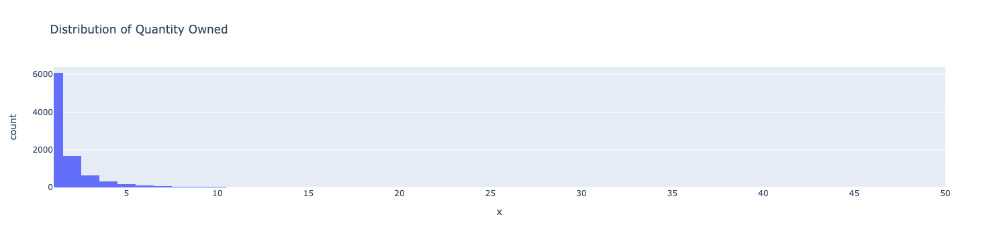

In [186]:
fig = px.histogram(data, x=data.buyer.value_counts(), range_x=(1,50), title='Distribution of Quantity Owned')
fig.show()

In [198]:
data.buyer.value_counts().head(5)

0x0a267cf51ef038fc00e71801f5a524aec06e4f07    1817
0xf24629fbb477e10f2cf331c2b7452d8596b5c7a5     171
0xc15753ae3b6099b8a3366b836433d6542645b876     163
0x0000000031f7382a812c64b604da4fc520afef4b     140
0x011c23b3aadaf3d4991f3abee262a34d18e9fdb5      88
Name: buyer, dtype: int64

In [188]:
len(data.buyer.unique()), len(data.seller.unique())

(9267, 7077)